## Diseño de filtros FIR  aplicados 
## Gilber Camilo Agatón Samboni
## CC:1117549205

#### Quiero crear un filtro FIR pasa bandas para poder filtrar una canción y eliminar el lo posible uno de sus instrumentos musicales  el cual se encuentra en un determinado rango de frecuencias 

In [1]:
#Librerias a usar 
import numpy as np # Libreria numerica
import matplotlib.pyplot as plt #Libreria matemática 
from scipy.io.wavfile import read # libreria para lectura de archivos de audio
from scipy.io.wavfile import write  #libreria para crear el audio
from scipy.io import wavfile #Libreria para cargar el audio
from IPython.display import Audio # para escuchar la senal
import scipy.signal as sp #Libreria para señales
import sympy as sy

### Para diseñar el filtro necesito saber las frecuencias donde va dejar pasar, el orden del filtro y la frecuencia de muestreo

     Frecuencia de corte 1: 3700 Hz.          Frecuencia de corte 2: 4300 Hz.           N=13.            Fs=13000 Hz

#### Con los datos anteriores se puede crear un filtro FIR por medio de muestreo en frecuencia.

In [2]:
fc1_f1=3700 # Frecuencia de corte 1
fc2_f1=4300  # Frecuencia de corte 2
N_f1=13      # orden del filtro 
Fs_f1=13000  # Frecuencia de muestreo

#Se calcula M par poder saber cada cuanto se toma una muestra. 
M_f1 = int(Fs_f1/N_f1) # Es para los pasos de k-> k(1khz)
K_f1 =1 # limite de la sumatoria

# Se realiza el siguiente condicional para cuando N sea par o impar, dado que la formula cambia segun corresponda. 
if N_f1%2 ==0:
    K_f1=int(N_f1/2 -1)# para un N par
else:
    K_f1=int((N_f1-1)/2) #Para un N impar
    

# Se calcula el factor de simetría,el cual nos sirve para definir como se distribuyen las componentes con relación a su punto medio
alfa_f1 = int((N_f1-1)/2) #Constante

hk_f1 = [] #Coeficientes de mi ventana h para encontrar la ecuacion
n_f1 =np.arange(0,K_f1+1)

# Lleno el vector de coeficientes hk para multiplicar
for i in range(K_f1+1):
    if i*M_f1 < fc1_f1 or i*M_f1>fc2_f1:
        hk_f1.append(0)
    else:
        hk_f1.append(1)

#se crea una funcion symbolica 
h_f1 = 1
n_f1 = sy.Symbol("n")


for i in range(1,int(K_f1)):
    h_f1+=2*hk_f1[i]*sy.cos((2*np.pi*i*(n_f1-alfa_f1))/N_f1)

h_f1=(1/N_f1)*h_f1

#Array para sustituir valores de n de 0 a N/2 
hn_f1 = np.array([])
for i in range(N_f1):
    #Reemplazo la n completa para obtener los coeficientes del filtro
    hn_f1= np.append(hn_f1,float(h_f1.subs(n_f1,i)))

w_f1,Hh_f1 = sp.freqz(hn_f1,1, whole = True, worN=1024) #Respuesta en frecuencia

for i in range(N_f1//2):
    print("h({})".format(i),"= h({})".format(N_f1-i-1)," = ",np.round(hn_f1[i],5))
print("h(6) =",np.round(hn_f1[6],5))

h(0) = h(12)  =  0.16432
h(1) = h(11)  =  -0.07245
h(2) = h(10)  =  0.09547
h(3) = h(9)  =  0.21315
h(4) = h(8)  =  -0.03823
h(5) = h(7)  =  0.02237
h(6) = 0.23077


### Una vez creado el filro FIR, podemos observar su respuesta al impulso y el espectro resultante. Para ello realizamos el siguientes procedimiento: se realizará tanto en el dominio del tiempo discreto y en el dominio de la frecuencia.

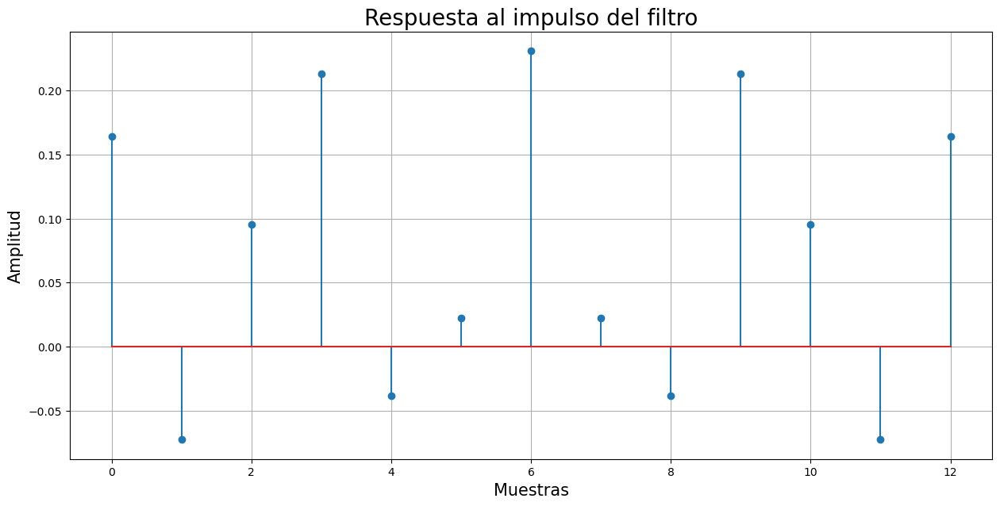

In [3]:
#Dominio de tiempo discreto
plt.figure(figsize=(15,7))
plt.stem(hn_f1)
plt.title("Respuesta al impulso del filtro",fontsize=20)
plt.xlabel("Muestras",fontsize=15)
plt.ylabel("Amplitud",fontsize=15)
plt.grid()
plt.show()

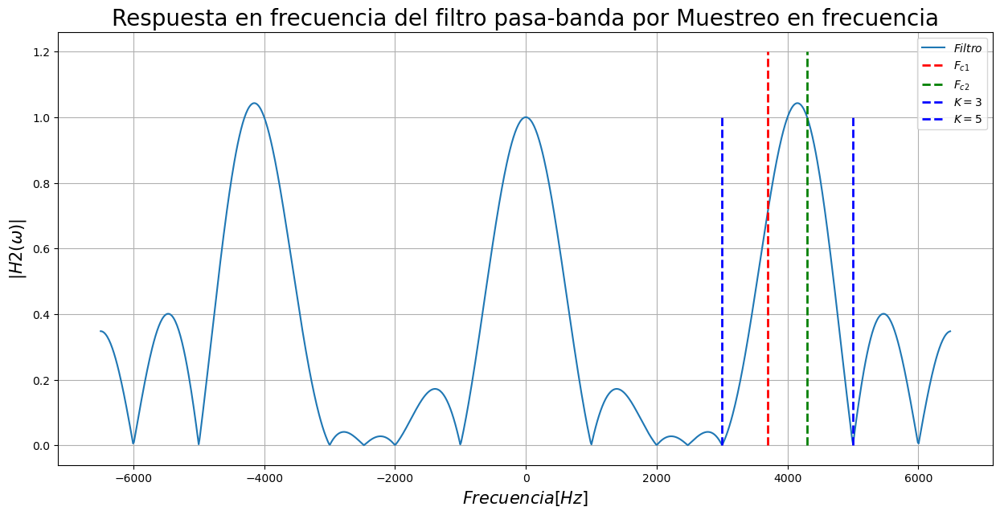

In [4]:
#Dominio de la frecuencia
plt.figure(figsize=(15,7))
plt.title('Respuesta en frecuencia del filtro pasa-banda por Muestreo en frecuencia', fontsize=20)
plt.plot((w_f1-np.pi)*Fs_f1/(2*np.pi), np.abs(np.fft.fftshift(Hh_f1)), label='$Filtro$')
plt.vlines(fc1_f1, 0, 1.2, color='r', lw=2, linestyle='--',label='$F_{c1}$')
plt.vlines(fc2_f1, 0, 1.2, color='g', lw=2, linestyle='--',label='$F_{c2}$')
plt.vlines(3000, 0, 1, color='b', lw=2, linestyle='--',label='$K=3$')
plt.vlines(5000, 0, 1, color='b', lw=2, linestyle='--',label='$K=5$')
plt.xlabel("$Frecuencia [Hz]$", fontsize=15)
plt.ylabel("$|H2(\omega)|$", fontsize=15)
plt.legend()
plt.grid()
plt.show()

In [5]:
def Audio_tiempo(t,y,audio,filtrado):
    """
    Funcion para graficar el audio en el dominio del tiempo, tiene como entrada:
        - t: Vector del eje x (tiempo)
        - y: Vector para graficar los valores del eje y ()
        - audio: el número del audio que estoy procesando para poder llevar el control de manera organizada
        - filtrado: una variable booleana para verificar si se filtro o no el audio e imprimir el titulo 
    """ 
    
    plt.figure(figsize = (15,4))
    if filtrado:
        plt.plot(t,y,color="#746AB0")
        plt.title("Señal filtrada del Audio {}".format(audio), fontsize=20) 
    else:
        plt.plot(t,y,color="#E83845")
        plt.title("Señal original del Audio {}".format(audio), fontsize=20)
    plt.xlabel("Tiempo (s)", fontsize=15)
    plt.ylabel("Amplitud", fontsize=15)
    plt.grid()
    plt.show() # Mostrar la grafica

### Creamos una función para graficar el espectro en frecuencia del audio 

In [6]:
def Audio_frecuencia(freq,xfreq,audio):
    """
    Funcion para graficar el espectro de un audio original, tiene como entrada
        - freq: vector de frecuencias
        - xfrec: vector del espectro
        - audio: número de audio para impresión en el titulo     
    """
    plt.figure(figsize=(15,7)) #Tamaño de la figura 
    plt.plot(freq, np.abs(xfreq),c="#ff7700")
    plt.xlabel("Hz",fontsize=15)
    plt.ylabel("$|H(\omega)|$",fontsize=15)
    plt.title("Espectro original del Audio {}".format(audio), fontsize=20)
    plt.xlim([-6000,6000])
    plt.grid()
    plt.show()

In [7]:
def G_Audio_Filtrado_freq(freq_fm,xfreq_fm,audio,fc1,fc2,):
    """
    Funcion para graficar el espectro de un audio con filtro pasa-banda
    con muestreo en frecuencia, tiene como entrada:
        - freq_fm: vector de frecuencias filtradas
        - xfrec_fm: vector del espectro filtrado
        - fc1: Frecuencia de corte inferior
        - Fc2: frecuencia de corte supereior
        - audio: número de audio para impresión en el titulo    
    """
    plt.figure(figsize=(15,7)) #Tamaño de la figura 
    plt.plot(freq_fm, np.abs(xfreq_fm)/max(abs(xfreq_fm)),c="#388E8E")
    plt.vlines(fc1, 0, 1, color='r', lw=2, linestyle='--',label='$F_{c1}$')
    plt.vlines(fc2, 0, 1, color='g', lw=2, linestyle='--',label='$F_{c2}$')
    plt.vlines(3000, 0, 1, color='b', lw=2, linestyle='--',label='$K=3$')
    plt.vlines(5000, 0, 1, color='b', lw=2, linestyle='--',label='$K=5$')
    plt.xlabel("Hz",fontsize=15)
    plt.ylabel("$|H(\omega)|$",fontsize=15)
    plt.title("Espectro filtrado del Audio {}".format(audio), fontsize=20)
    plt.xlim([-6000,6000])
    plt.legend()
    plt.grid()
    plt.show()

###  Diseñamos un un filtro FIR pasa-bajas por el método de enventanado, con las siguientes condiciones: 
#### * Frecuencia de muestreo: 12 kHz
#### * Frecuencia de corte: 600 Hz
#### * Ripple: 0.4%
#### * Ancho de banda de la transición: 300 Hz

In [8]:
# Primero encontramos el ripple para determinar que tipo de enventanado se utiliza 
rp_f2 =0.004 #ripple dado 
rpdb_f2=20*np.log10(rp_f2) # ripple en db
print("El ripple en db:",rpdb_f2) 

El ripple en db: -47.95880017344075


### El valor anterior nos muestra que se puede utilizar dos tipos de ventanas, la hamming y la blackman. en nuestro caso vamos a utilizar Hamming
<img src="https://latex.codecogs.com/svg.image?\omega(n)&space;=&space;0.54-0.46\cos\left&space;(\frac{2\pi&space;n}{N-1}&space;\right)" />

Y como es un filtro pasa bajas, entonces:
<img src="https://latex.codecogs.com/svg.image?h_1&space;=&space;\frac{\omega&space;_c}{\pi}Sinc(\frac{\omega_cn}{\pi})" />  


In [27]:
#Diseño del filtro y encontrar orden
fm_f2 =200 # Ancho de banda de transición  
Fc_f2=600 # Frecuencia de corte
Fs_f2=12000 #Frecuencia de muestreo
M_f2 = (6*Fs_f2)/fm_f2 #Orden del filtro
wc_f2 = (2*np.pi*Fc_f2)/Fs_f2       #Frecuencia de corte normalizada en radianes

if(M_f2%2 == 0):  #Lo hace impar
    M_f2 = M_f2+1
M_f2= int(M_f2)
print('Orden del filtro Pasa-bajos: ', M_f2)

Orden del filtro Pasa-bajos:  361


In [10]:
#Creación de a ventana
n_f2 = np.arange(-(M_f2-1)/2,M_f2/2)  #Vector de muestras
hi_f2 = (wc_f2/np.pi)*np.sinc((wc_f2*n_f2)/np.pi) #Respuesta del filtro ideal
win_f2 = 0.54-0.46*np.cos(2*np.pi*np.arange(len(n_f2))/(M_f2-1)) #ventana hamming
h_f2 = hi_f2*win_f2                  #Multiplico la respuesta ideal por la ventana
#print(h)
w_sv_f2,Hh_sv_f2 = sp.freqz(hi_f2,1, whole=True, worN=2048) #Respuesta en frecuencia del filtro sin eventanado
w_f2, Hh_f2 = sp.freqz(h_f2,1, whole=True, worN=2048) #Respuesta en frecuencia del filtro enventanado

#### Calculamos el h(n) causal, con los primeros 5 y últimos 5 términos, dado que el orden dle filtro es muy alto no se coloca todos los valores del h(n)

In [11]:
print("los 5 primeros y ultimos")
for i in range(0,6):
    print("win({})".format(i),"= win({})".format(M_f2-i-1)," = ",win_f2[i])
    print("h({})".format(i),"= h({})".format(M_f2-i-1)," = ",h_f2[i])

los 5 primeros y ultimos
win(0) = win(360)  =  0.08000000000000002
h(0) = h(360)  =  -3.1185374660155015e-19
win(1) = win(359)  =  0.08007006022806001
h(1) = h(359)  =  -4.399968989045795e-05
win(2) = win(358)  =  0.08028021957121595
h(2) = h(358)  =  -8.438346641468691e-05
win(3) = win(357)  =  0.08063041401289606
h(3) = h(357)  =  -0.00011730955714971217
win(4) = win(356)  =  0.08112053688048088
h(4) = h(356)  =  -0.0001395322512564273
win(5) = win(355)  =  0.08175043887779704
h(5) = h(355)  =  -0.00014869698796952295


#### Graficamos la respuesta al impulso sin la ventana

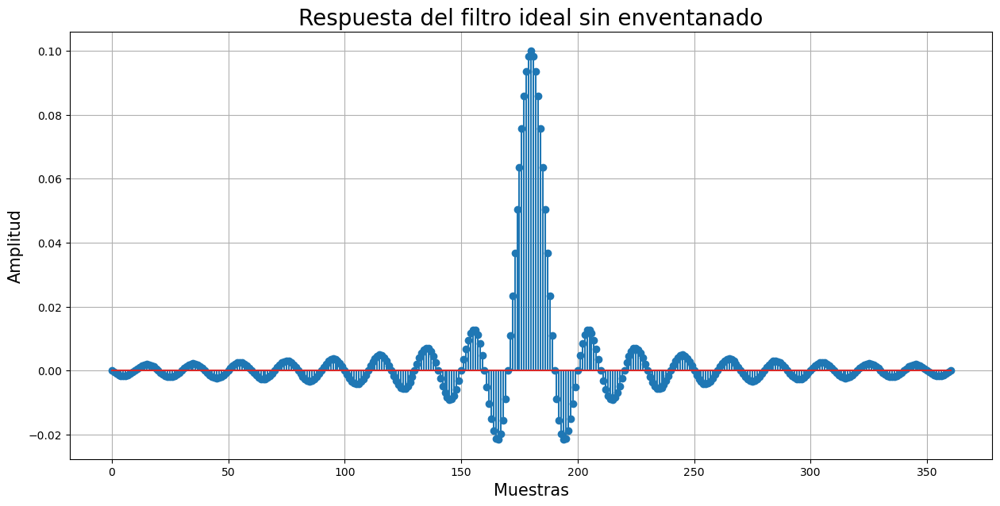

In [12]:
n_f2=np.arange(0,M_f2,1) # tamaño vector temporal
plt.figure(figsize=(15,7))
plt.stem(n_f2,hi_f2)
plt.title("Respuesta del filtro ideal sin enventanado",fontsize=20)
plt.xlabel("Muestras",fontsize=15)
plt.ylabel("Amplitud",fontsize=15)
plt.grid()
plt.show()

#### Grafica ventana Hamming


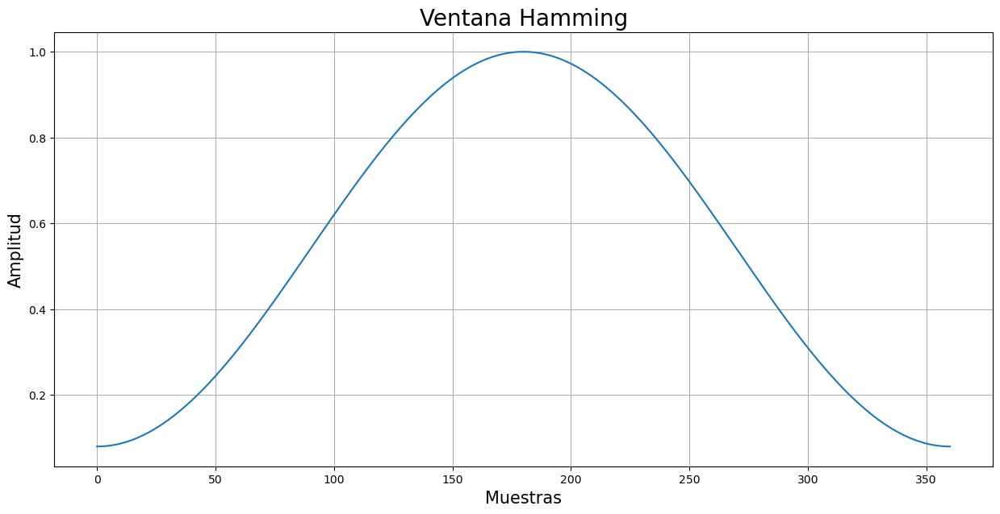

In [13]:
plt.figure(figsize=(15,7))
plt.plot(n_f2,win_f2)
plt.title("Ventana Hamming",fontsize=20)
plt.xlabel("Muestras",fontsize=15)
plt.ylabel("Amplitud",fontsize=15)
plt.grid()
plt.show()

#### Graficamos la respuesta al impulso con enventanado

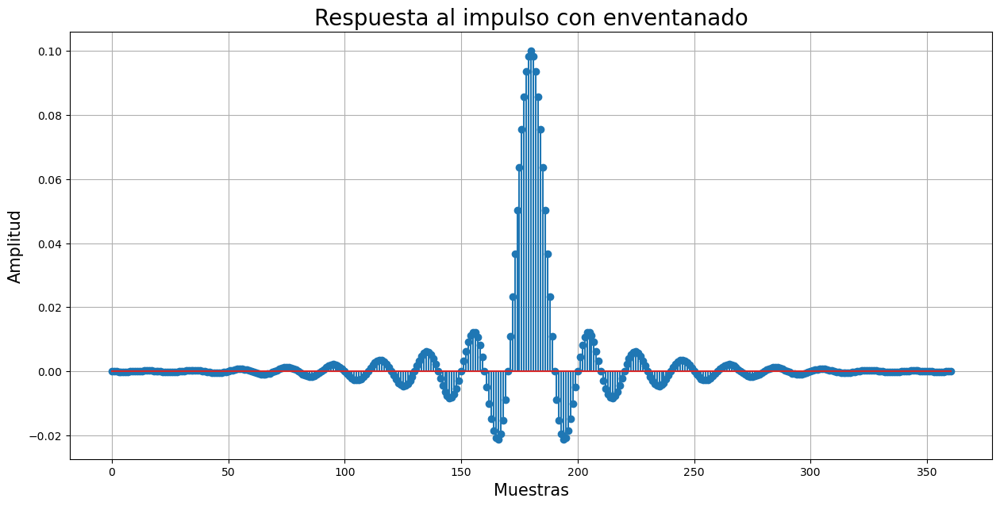

In [14]:
plt.figure(figsize=(15,7))
plt.stem(n_f2,h_f2)
plt.title("Respuesta al impulso con enventanado",fontsize=20)
plt.xlabel("Muestras",fontsize=15)
plt.ylabel("Amplitud",fontsize=15)
plt.grid()
plt.show()

#### Gráfica del filtro sin enventanado


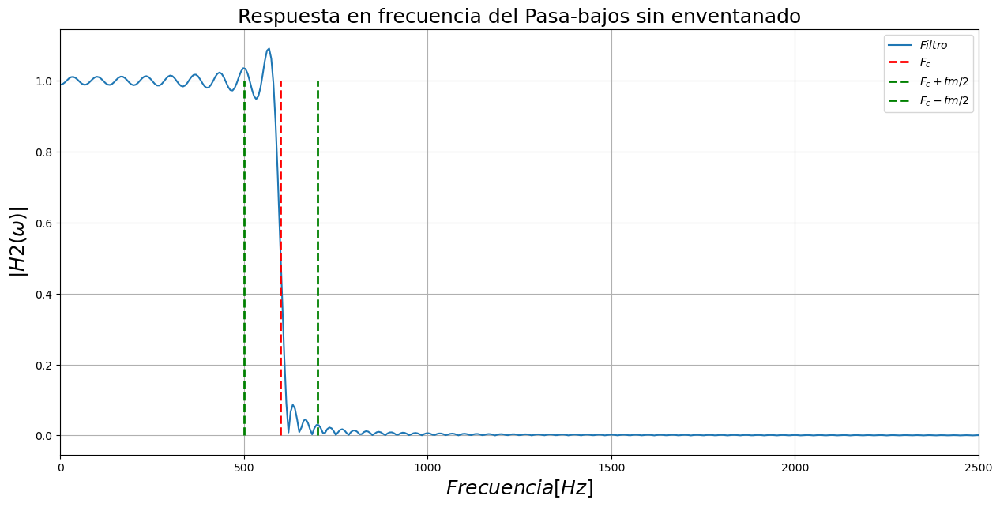

In [15]:
plt.figure(figsize=(15,7))
plt.title('Respuesta en frecuencia del Pasa-bajos sin enventanado', fontsize=18)
plt.plot((w_sv_f2 -np.pi)*Fs_f2/(2*np.pi), np.abs(np.fft.fftshift(Hh_sv_f2)), label='$Filtro$')
plt.vlines(Fc_f2, 0, 1, color='r', lw=2, linestyle='--',label='$F_c$')
plt.vlines(Fc_f2+fm_f2/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(Fc_f2-fm_f2/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c-fm/2$')
plt.xlim([-0,2500])
plt.xlabel("$Frecuencia [Hz]$", fontsize=18)
plt.ylabel("$|H2(\omega)|$", fontsize=18)
plt.legend()
plt.grid()
plt.show()

### Ahora, graficamos el filtro con el enventanado

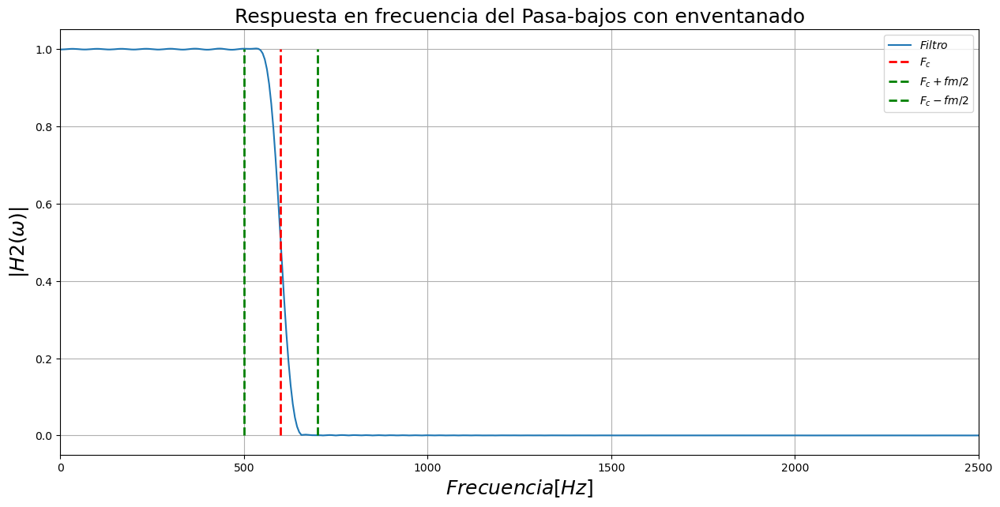

In [16]:
plt.figure(figsize=(15,7))
plt.title('Respuesta en frecuencia del Pasa-bajos con enventanado', fontsize=18)
plt.plot((w_f2-np.pi)*Fs_f2/(2*np.pi), np.abs(np.fft.fftshift(Hh_f2)), label='$Filtro$')
plt.vlines(Fc_f2, 0, 1, color='r', lw=2, linestyle='--',label='$F_c$')
plt.vlines(Fc_f2+fm_f2/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(Fc_f2-fm_f2/2, 0, 1, color='g', lw=2, linestyle='--',label='$F_c-fm/2$')
plt.xlim([-0,2500])
plt.xlabel("$Frecuencia [Hz]$", fontsize=18)
plt.ylabel("$|H2(\omega)|$", fontsize=18)
plt.legend()
plt.grid()
plt.show()

In [17]:
def filtro_enventanado(freq,xfreq,audio,fc,fm):
    """
    Funcion para graficar el espectro de un audio con filtro pasa-baja
    con muestreo en frecuencia, tiene como entrada:
        - freq: vector de frecuencias filtradas
        - xfre: vector del espectro filtrado
        - fc: Frecuencia de corte del filtro
        - audio: número de audio para impresión en el titulo    
    """
    plt.figure(figsize=(15,7)) #Tamaño de la figura 
    plt.plot(freq, np.abs(xfreq)/max(abs(xfreq)),c="#388E8E")
    plt.vlines(fc, 0, 1, color='r', lw=2, linestyle='--', label='$F_c$')
    plt.vlines(fc+fm/2, 0, 1, color='m', lw=2, linestyle='--', label='$F_c+f_m/2$')
    plt.vlines(fc-fm/2, 0, 1, color='m', lw=2, linestyle='--', label='$F_c-f_m/2$')
    plt.xlabel("Hz",fontsize=15)
    plt.ylabel("$|H(\omega)|$",fontsize=15)
    plt.title("Espectro filtrado del Audio {}".format(audio), fontsize=20)
    plt.xlim([-2000,2000])
    plt.legend()
    plt.grid()
    plt.show()

### Par ver el funcionamiento del filtro se tomará un audio y lo pasaremos por el filtro para ver los efectos que tiene el filtro sobre el audio

## Vamos a filtrar dos veces el audio, la primera se filtrará por el filtro rechaza banda y después se filtrará por el pasa bajas 

In [18]:
# Señal original de Audio
# cargar el archivo de audio estéreo
rate_f1, data_f1 = wavfile.read('naruto.wav')
left_channel_f1 = data_f1[:, 0]
norm1_f1 =left_channel_f1/np.max(np.abs(left_channel_f1))
t1_f1=np.arange(0, len(data_f1)/rate_f1, 1.0/rate_f1) # Vector de tiempo
print(rate_f1)

44100


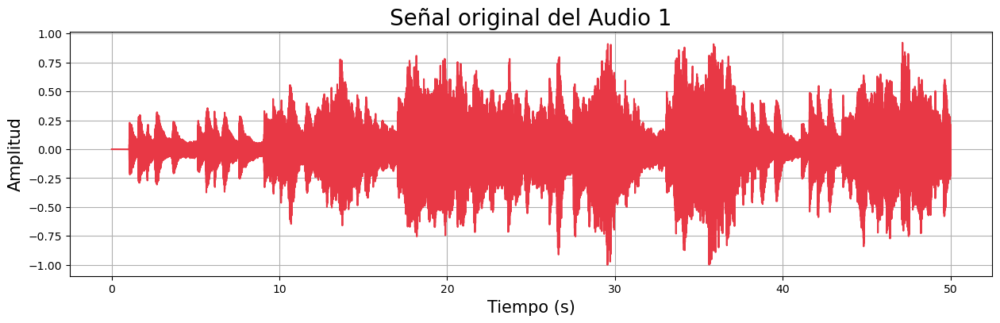

In [19]:
Audio_tiempo(t1_f1,norm1_f1,1,False)

In [20]:
Audio(norm1_f1, rate=rate_f1)

### Ahora llevamos el audio al dominio de la frecuencia para poder analizar el espectro, para le aplicamos la transformada de fourier

In [21]:
# Espectro del audio 1 original
xfreq1_f1 = np.fft.fft(left_channel_f1) #Transformada Rapida de Fourier del audio
n_1_f1 = np.size(xfreq1_f1) #Vector de Frecuencias
freq1_f1 = np.arange(-n_1_f1/2, n_1_f1/2)*rate_f1/n_1_f1#Vector de Frecuencias = np.size(xfreq1)
xfreq1_f1 = np.fft.fftshift(xfreq1_f1) #organizar el vector del espectro: 


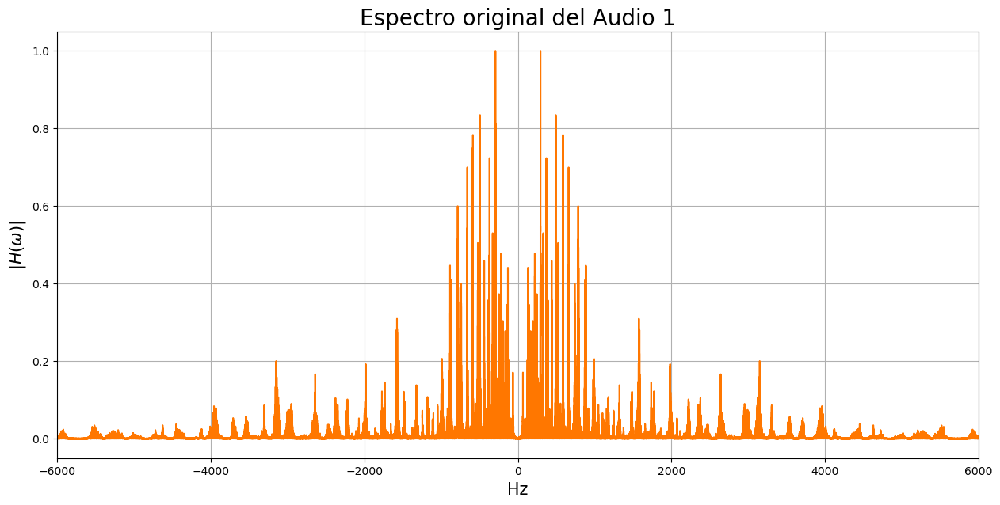

In [22]:
Audio_frecuencia(freq1_f1,np.abs(xfreq1_f1)/max(abs(xfreq1_f1)),1)

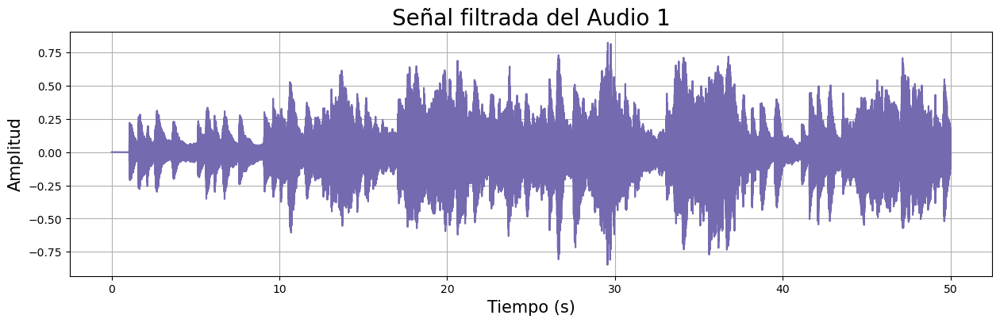

In [23]:
# Aplicando primer filtro a señal de audio
y_1_f1 = np.convolve(hn_f1, norm1_f1, mode='same')          #Filtra la señal requerida
Y_1_f1 = np.fft.fft(y_1_f1)   #FFT de la señal filtrada para mostrarla más comodamente
freq_Y_f1 = np.fft.fftfreq(Y_1_f1.size)*Fs_f1        #Vector de Frecuencias

#Se grafica el audio de la señal filtrada en nuestro primer filtro
filtrado=True
Audio_tiempo(t1_f1,y_1_f1,1,True)
Audio(y_1_f1, rate=rate_f1) # Reproductor señal de audio filtrado

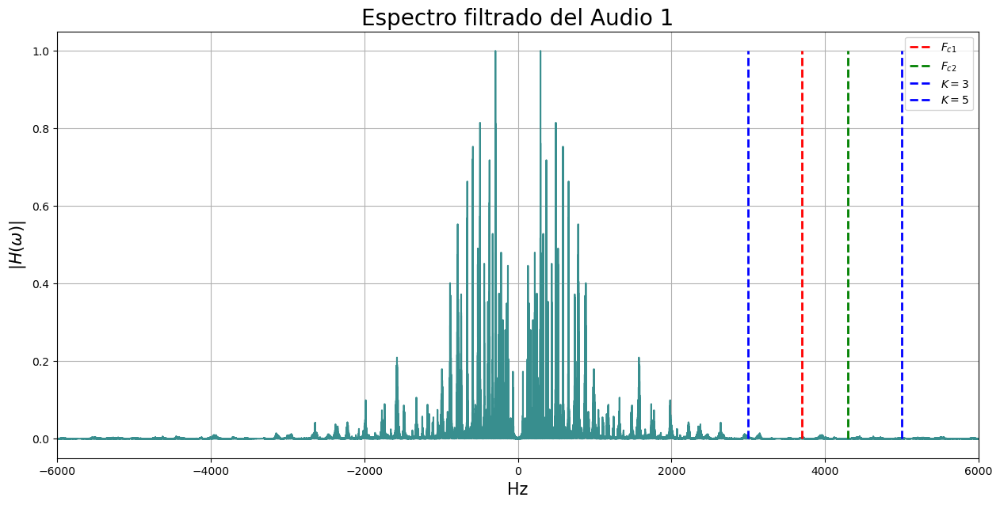

In [24]:
#Transformada Rapida de Fourier del audio
xfreq1_f1 = np.fft.fft(y_1_f1)
#Vector de Frecuencias
n_1_f1 = np.size(xfreq1_f1)
#Vector de Frecuencias = np.size(xfreq1)
freq1_f1= np.arange(-n_1_f1/2, n_1_f1/2)*rate_f1/n_1_f1
#organizar el vector del espectro: 
xfreq1_f1 = np.fft.fftshift(xfreq1_f1)

#Normalizar amplitud del vector

# Grafica
G_Audio_Filtrado_freq(freq1_f1,xfreq1_f1,1,fc1_f1,fc2_f1,)

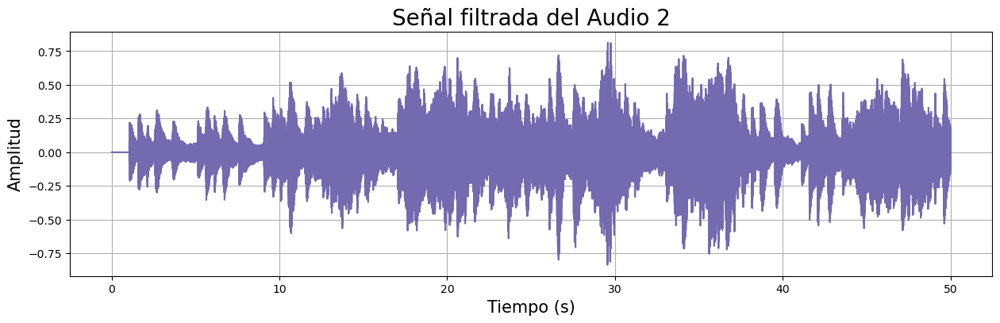

In [25]:
# Aplicando segundo filtro a señal de audio
y_1_f2 = np.convolve(h_f2, y_1_f1, mode='same')          #Filtra la señal requerida
Y_1_f2 = np.fft.fft(y_1_f2)   #FFT de la señal filtrada para mostrarla más comodamente
freq_Y_f2 = np.fft.fftfreq(Y_1_f2.size)*Fs_f2        #Vector de Frecuencias

#Grafica
#Se grafica el audio en el tiempo ya filtrado
filtrado=True
Audio_tiempo(t1_f1,y_1_f2,2,filtrado)
Audio(y_1_f2, rate=rate_f1) # Reproductor señal de audio filtrado

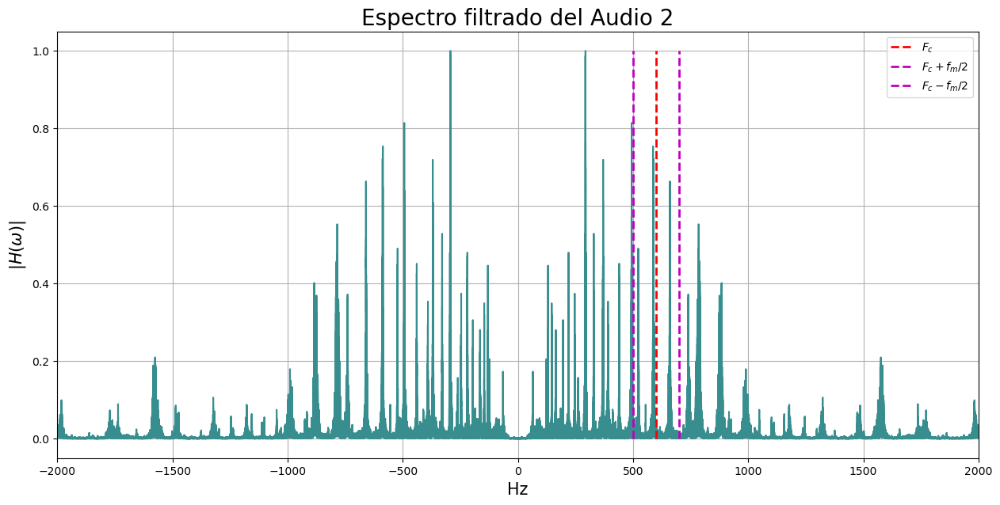

In [26]:
#Transformada Rapida de Fourier del audio
xfreq1_f2 = np.fft.fft(y_1_f2)
#Vector de Frecuencias
n_1_f2 = np.size(xfreq1_f2)
#Vector de Frecuencias = np.size(xfreq1)
freq1_f2 = np.arange(-n_1_f2/2, n_1_f2/2)*rate_f1/n_1_f2

#organizar el vector del espectro: 
xfreq1_f2 = np.fft.fftshift(xfreq1_f2)

filtro_enventanado(freq1_f2,xfreq1_f2,2,Fc_f2,fm_f2)

### CONCLUSIONES
- El Ripple corresponde a las oscilaciones que se presentan en la señal, la banda pasante se determina a partir de los tres decibelios y el Roll-off o banda de transición o de caida , esta asociado con el ancho del lobulo principal.
- Los filtros permiten eliminar ruido y tambien eliminar los datos de frecuencias que no aportan información, por lo que solo se conservan los datos de interés, además permite suavizar la respuesta en frecuencia mejorando la calidad de la señal.
- Diseñar un filtro implica conocer muy bien el fenomeno que se desea filtrar con el proposito de optimizar los recursos para no sobredimensionar o infradimensionar las necesidades
- Se comprende el uso de filtros para extraer informacion requerida de una señal, como la separación de ciertos instrumentos limitando su frecuencia de corte es posible la eliminación de estos.
- El filtro por el método de muestreo en frecuencia, tiene la gran limitación de que si el orden N es muy bajo, las muestras van a quedar muy separadas y va a generar que el filtro no sea tan eficiente, dejando pasar freucuencias que se desean eliminar 
- Es importante realizar enventanado antes de filtrar, ya que esto disminuye e rizado que se tiene en los filtros aunque dependiendo de la ventana puede aumentar el ancho de banda de transición.
- Cada audio tiene un rango de frecuencias dominantes diferente, razón por la cual no todos los filtros son óptimos para filtrarlos.